## Calibrate, Undistort, Unwarp

## Calibrate

Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

The code for this step is contained in the first code cell of the IPython notebook 
located in "./examples/example.ipynb" (or in lines # through # of the file called some_file.py).

I start by preparing "object points", which will be the (x, y, z) coordinates of the chessboard corners in the world. Here I am assuming the chessboard is fixed on the (x, y) plane at z=0, such that the object points are the same for each calibration image. Thus, objp is just a replicated array of coordinates, and objpoints will be appended with a copy of it every time I successfully detect all chessboard corners in a test image. imgpoints will be appended with the (x, y) pixel position of each of the corners in the image plane with each successful chessboard detection.

I then used the output objpoints and imgpoints to compute the camera calibration and distortion coefficients using the cv2.calibrateCamera() function. I applied this distortion correction to the test image using the cv2.undistort() function and obtained this result:

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm import tqdm
plt.style.use('ggplot')

# So we can see the output of multiple variables in a single cell
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import moviepy

np.__version__
moviepy.__version__

'0.2.3.1'

### Obtain chessboard corners

In [2]:
# Prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(8,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Create a list with all of the calibration images
image_cals = glob.glob('camera-cal/cal*')

# Step through the list and search for chessboard corners
for idx, fname in tqdm(enumerate(image_cals)):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

20it [00:05,  3.36it/s]


### Take a look at one particular calibration's _objpoints_ and _imgpoints_

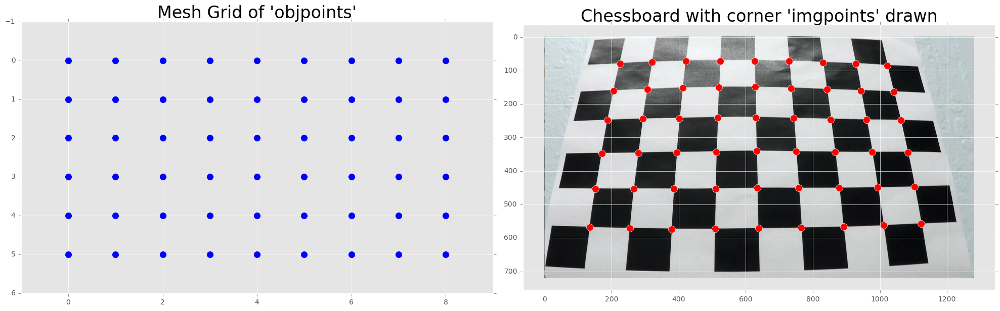

In [3]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,6))
f.tight_layout()

ax1.set_title('Mesh Grid of \'objpoints\'', fontdict={'fontsize':24}, y=1.0)
ax1.scatter(x=objp[:,0], y=objp[:,1], s=100)
ax1.set_ylim(6, -1)

ax2.set_title('Chessboard with corner \'imgpoints\' drawn', fontdict={'fontsize':24}, y=1.0)
example_cal_image = cv2.imread(image_cals[-7])
ax2.imshow(example_cal_image)

# Prepare corners for drawing on selected cal. image
corners = np.squeeze(imgpoints[-5])
ax2.scatter(corners[:,0], corners[:,1], c='r', s=100);

## Undistort

### Undisort the image

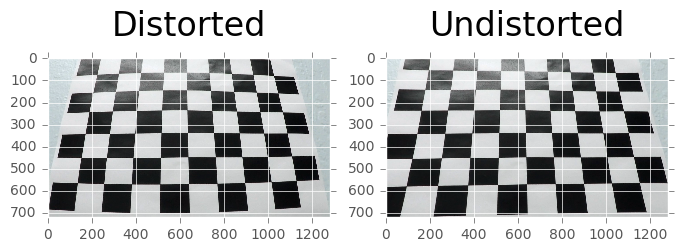

In [4]:
# Load a test image to see how it will become undistored (and to get its size)
test_image = cv2.imread(image_cals[-7])
img_size = (test_image.shape[1], test_image.shape[0])

# Perform camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size ,None,None)

# This function will end up in the pipeline!
def undistort_img(img, mtx, dist):
    return cv2.undistort(img, mtx, dist, None, mtx)

undistort = undistort_img(test_image, mtx, dist)
    
# Let's see a comarison of 'distorted' and 'undistorted'
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,6))
ax1.set_title('Distorted', fontdict={'fontsize':24}, y=1.1)
ax1.imshow(test_image)
ax2.set_title('Undistorted', fontdict={'fontsize':24}, y=1.1)
ax2.imshow(undistort);

## Unwarp

### Unwarp Image

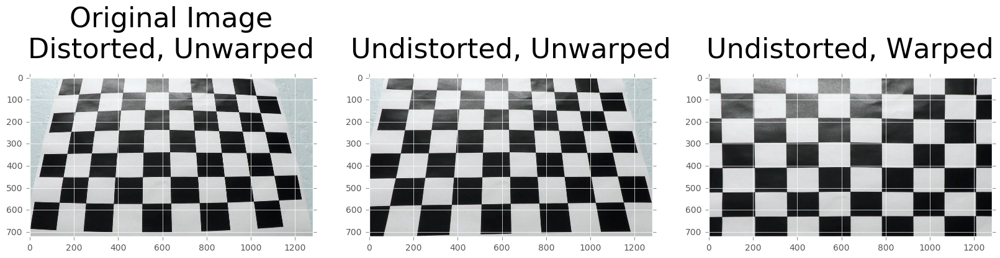

In [5]:
# Setup values for 'src' and 'dst' points
offset = 100 # to offset 'dst' points
nx = 9
ny = 6

# Grab the four outer corners of the board as 'src' points. Top left, CW
src = np.float32([corners[0],
                  corners[nx-1],
                  corners[-1],
                  corners[-nx]])

# Create a list of 'dst' points by drawing a large rectangle with the points. Top left, CW
dst = np.float32([[offset,offset],
                  [img_size[0]-offset,offset],
                  [img_size[0]-offset,img_size[1]-offset],
                  [offset, img_size[1]-offset]])

# Compute the perspective transform, M, given source and destination points
M = cv2.getPerspectiveTransform(src, dst)

# Compute the inverse perspective transform:
Minv = cv2.getPerspectiveTransform(dst, src)

# Unwarp an image using the perspective(img, M, img_size, flags=cv2.INTER_LINEAR)
warped = cv2.warpPerspective(undistort, M, img_size, flags=cv2.INTER_LINEAR)

# This function will end up in the pipeline!
def unwarp(src, dst, img, M, img_size):
    # Compute the perspective transform, M, given source and destination points
    M = cv2.getPerspectiveTransform(src, dst)
    
    # Unwarp an image using the perspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
# This function will end up in the pipeline!
def warp(img , dst, src):
    # Compute the inverse perspective transform:
    Minv = cv2.getPerspectiveTransform(dst, src)
    
# Let's see a comparison of an undistorde, unwarped picture and its warped counterpart
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,6))
ax1.set_title('Original Image\nDistorted, Unwarped', fontdict={'fontsize':32}, y=1.1)
ax1.imshow(test_image)
ax2.set_title('Undistorted, Unwarped', fontdict={'fontsize':32}, y=1.1)
ax2.imshow(undistort)
ax3.set_title('Undistorted, Warped', fontdict={'fontsize':32}, y=1.1)
ax3.imshow(warped);

## Pipeline

Provide an example of a distortion-corrected image.

Distortion correction that was calculated via camera calibration has been correctly applied to each image. An example of a distortion corrected image should be included in the writeup (or saved to a folder) and submitted with the project.

### Undistort image

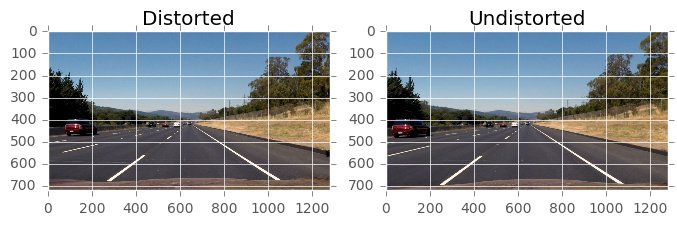

In [6]:
image = cv2.imread('test-images/straight_lines2.jpg')
image_RGB = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
undistort = undistort_img(image_RGB, mtx, dist)

# Let's see a comarison of 'distorted' and 'undistorted'
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,6))
ax1.set_title('Distorted')
ax1.imshow(image_RGB)
ax2.set_title('Undistorted')
ax2.imshow(undistort);

### Image Pipeline Functions
* return_s_channel
* apply_sobel_thresh
* apply_dir_thresh
* apply_mag_thresh


In [145]:
def apply_BGR2HLS(img):
    # input is BGR image and output is a HLS image
    return cv2.cvtColor(img, cv2.COLOR_BGR2HLS)

def return_h_channel(img, thresh=(0,255)):
    # input is a HLS image and output is only the H Channel thresholded
    h_channel = img[:,:,0]
    h_binary = np.zeros_like(h_channel)
    h_binary[(h_channel > thresh[0]) & (h_channel < thresh[1])] = 1
    return h_binary

def return_l_channel(img, thresh=(0,255)):
    # input is a HLS image and output is only the L Channel thresholded
    l_channel = img[:,:,1]
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel > thresh[0]) & (l_channel < thresh[1])] = 1
    return l_binary

def return_s_channel(img, thresh=(0,255)):
    # input is a HLS image and output is only the S Channel thresholded
    s_channel = img[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel > thresh[0]) & (s_channel < thresh[1])] = 1
    return s_binary

def apply_sobel_thresh(img, orient='x', ksize=3, thresh=(0,255)):   
    
    # Determine Sobel orientation
    if 'x' in orient:
        sobel = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=ksize)
    else:
        sobel = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=ksize)
    # We only to work with positive gradients from the sobel covolution
    sobel_abs = np.absolute(sobel)
    # Scale the gradients to 8-bit (0-255) values
    sobel_scaled = np.uint8(255*sobel_abs / np.max(sobel_abs))
    # Apply a low and high pass threshold filter
    sobel_binary = np.zeros_like(sobel_scaled)
    sobel_binary[(sobel_scaled > thresh[0]) & (sobel_scaled < thresh[1])] = 1
    return sobel_binary

def apply_dir_thresh(img, ksize=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=ksize)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=ksize)
    # 3) Take the absolute value of the x and y gradients
    sobelx_abs = np.absolute(sobelx)
    sobely_abs = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    arctan = np.arctan2(sobely_abs, sobelx_abs)
    # 5) Create a binary mask where direction thresholds are met
    sobel_binary = np.zeros_like(arctan)
    sobel_binary[(arctan > thresh[0]) & (arctan < thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return sobel_binary

def apply_mag_thresh(img, ksize=3, thresh=(0, 255)):
    
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=ksize)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=ksize)
    # 3) Calculate the magnitude
    sobel_mag = np.sqrt(np.square(sobelx) + np.square(sobely))
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    sobel_scale = np.uint8(sobel_mag*255 / np.max(sobel_mag))
    # 5) Create a binary mask where mag thresholds are met
    sobel_binary = np.zeros_like(sobel_scale)
    sobel_binary[(sobel_scale > thresh[0]) & (sobel_scale < thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return sobel_binary

def apply_perpspective(img, src, dst):
    
    # Set the size (x, y)
    img_size = (img.shape[1], img.shape[0])
    # Compute the perspective transform, M, given source and destination points
    M = cv2.getPerspectiveTransform(src, dst)
    # Unwarp an image using the perspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
def apply_unwarp(img, src, dst):
    
    # Image size
    img_size = (img.shape[1], img.shape[0])
    # Compute the perspective transform, M, given source and destination points
    M = cv2.getPerspectiveTransform(src, dst)
    # Unwarp an image using the perspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)

def apply_overlay_image(src, overlay, posx, posy):
    '''
    Adapted from Rob Sears : https://gist.github.com/robsears/4260425
    '''
    # Set some constants
    S = (0.5, 0.5, 0.5, 0.5)
    D = (0.5, 0.5, 0.5, 0.5)
    overlay_width = overlay.shape[1]
    overlay_height = overlay.shape[0]
    source_width = src.shape[1]
    
    for x in range(overlay_width):
        if x+posx < source_width:
            for y in range(overlay_height):
                if y+posy < source_width:
                    source = cv.Get2D(src, y+posy, x+posx)
                    over   = cv.Get2D(overlay, y, x)
                    merger = [0, 0, 0, 0]

                    for i in range(3):
                        merger[i] = (S[i]*source[i]+D[i]*over[i])
                    merged = tuple(merger)

                    cv2.Set2D(src, y+posy, x+posx, merged)
    return src

In [136]:
image = cv2.imread('test-images/test5.jpg')
resize = cv2.resize(image, (100,100))
resize.shape
apply_overlay_image(image, resize, 100, 100)

(100, 100, 3)

NameError: name 'cv' is not defined

### Test out various color channels, thresholds, gradient directions, etc

## HLS variations

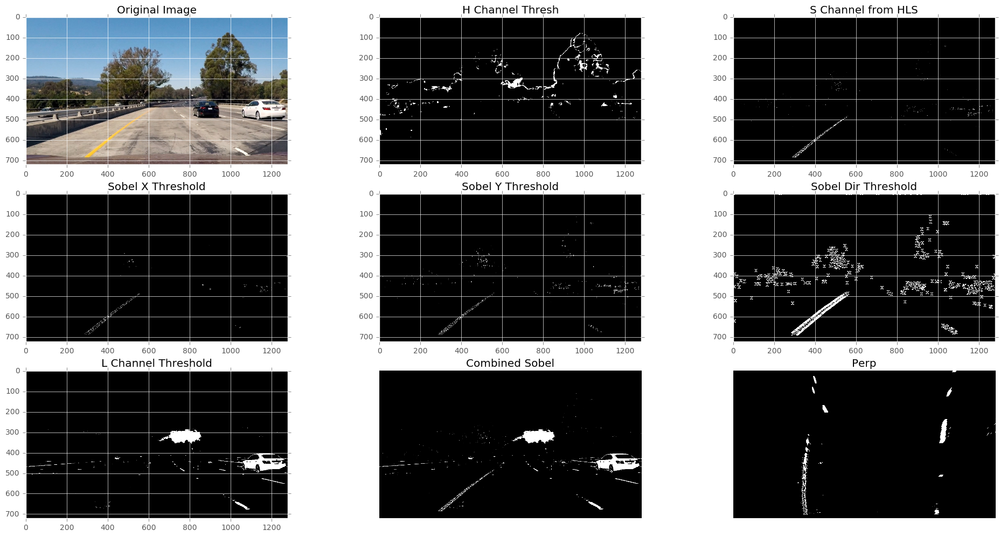

In [161]:
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6), (ax7, ax8, ax9)) = plt.subplots(3,3, figsize=(24,12))

image = cv2.imread('test-images/test1.jpg')
image_RGB = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
ax1.set_title('Original Image')
ax1.imshow(image_RGB)

image_hls = apply_BGR2HLS(image)
# ax2.set_title('HLS')
# ax2.imshow(image_hls)

# H_Channel Threshold
h_binary = return_h_channel(image_hls, thresh=(50,100))
ax2.set_title('H Channel Thresh')
ax2.imshow(h_binary, cmap='gray')

# S_Channel Threshold
s_binary = return_s_channel(image_hls, thresh=(220,255))
ax3.set_title('S Channel from HLS')
ax3.imshow(s_binary, cmap='gray')

sobel_x = apply_sobel_thresh(s_binary, ksize=9, thresh=(70,100))
ax4.set_title('Sobel X Threshold')
ax4.imshow(sobel_x, cmap='gray')

sobel_y = apply_sobel_thresh(s_binary, orient='y', ksize=5, thresh=(50,100))
ax5.set_title('Sobel Y Threshold')
ax5.imshow(sobel_y, cmap='gray')

sobel_dir = apply_dir_thresh(s_binary, ksize=15, thresh=(0.7, 1.3))
ax6.set_title('Sobel Dir Threshold')
ax6.imshow(sobel_dir, cmap='gray')

sobel_mag = apply_mag_thresh(s_binary, ksize=5, thresh=(30,100))
# ax7.set_title('Sobel Mag Threshold')
# ax7.imshow(sobel_mag, cmap='gray')

# L channel
l_binary = return_l_channel(image_hls, thresh=(200,255))
ax7.set_title('L Channel Threshold')
ax7.imshow(l_binary, cmap='gray')

# Combine Thresholded values
combined_binary = np.zeros_like(s_binary)
combined_binary[((sobel_x==1) & (sobel_y==1))
               | (l_binary==1)
               | (s_binary==1)] = 1

ax8.set_title('Combined Sobel')
ax8.set_axis_off()
ax8.imshow(combined_binary, cmap='gray');

plt.title('Perp')
plt.axis('off')
plt.imshow(apply_perpspective(combined_binary, src, dst), cmap='gray')
plt.show();

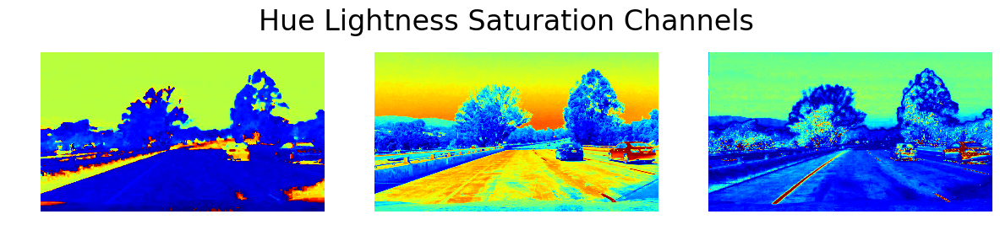

100%|████████████████████████████████████████████| 5/5 [00:03<00:00,  1.65it/s]


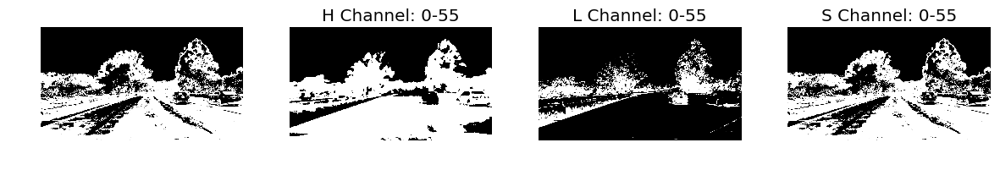

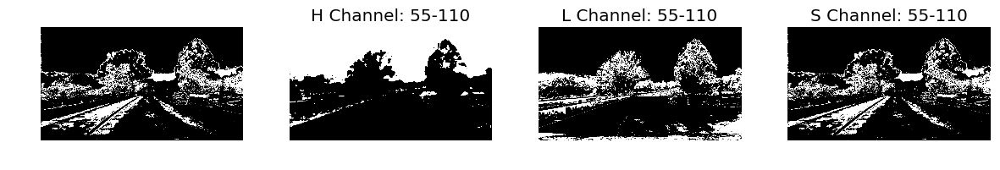

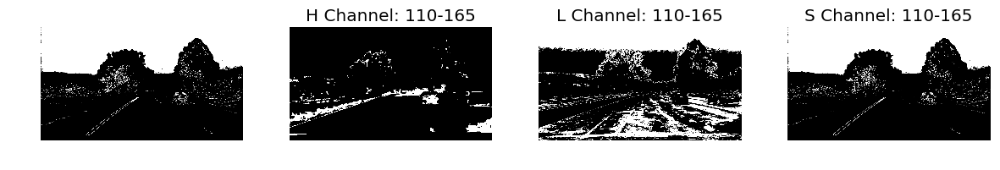

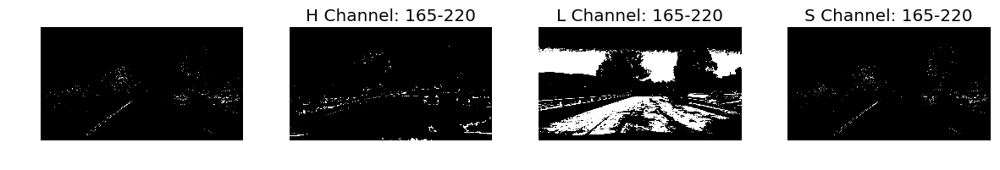

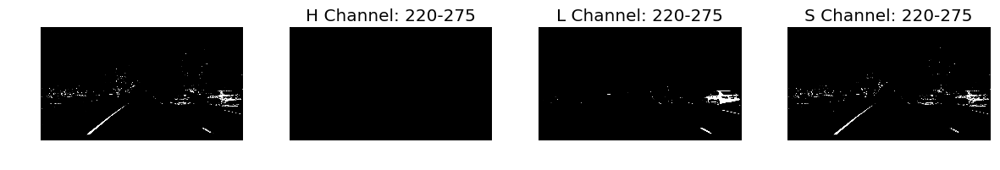

In [162]:
image_h = image_hls[:,:,0]
image_l = image_hls[:,:,1]
image_s = image_hls[:,:,2]

fig, _ = plt.subplots(1,3, figsize=(12,12))
fig.suptitle('Hue Lightness Saturation Channels', y=0.63, fontsize=24)
fig.tight_layout()
# Plot 
plt.subplot(1,3,1)
plt.axis('off')
plt.imshow(image_h)
# Plot 
plt.subplot(1,3,2)
plt.axis('off')
plt.imshow(image_l)
# Plot
plt.subplot(1,3,3)
plt.axis('off')
plt.imshow(image_s)
plt.show();


for iter in tqdm(range(0,255,55)):
    step = 55

    h_binary = np.zeros_like(image_h)
    h_binary[(image_h > iter) & (image_h < iter+step)] = 1
    l_binary = np.zeros_like(image_l)
    l_binary[(image_l > iter) & (image_l < iter+step)] = 1
    s_binary = np.zeros_like(image_s)
    s_binary[(image_s > iter) & (image_s < iter+step)] = 1

    
    plt.subplots(1,4, figsize=(12,12))
    
    # Orig HLS
    plt.subplot(1,4,1)
    plt.axis('off')
    plt.tight_layout()
    plt.imshow(s_binary, cmap='gray')

    # H Channel
    plt.subplot(1,4,2)
    plt.axis('off')
    plt.tight_layout()
    plt.title('H Channel: {}-{}'.format(iter, iter+step))
    plt.imshow(h_binary, cmap='gray')
    
    # L Channel
    plt.subplot(1,4,3)
    plt.axis('off')
    plt.tight_layout()
    plt.title('L Channel: {}-{}'.format(iter, iter+step))
    plt.imshow(l_binary, cmap='gray')
    
    # S Channel
    plt.subplot(1,4,4)
    plt.axis('off')
    plt.tight_layout()
    plt.title('S Channel: {}-{}'.format(iter, iter+step))
    plt.imshow(s_binary, cmap='gray')
    
plt.show();

## RGB variations

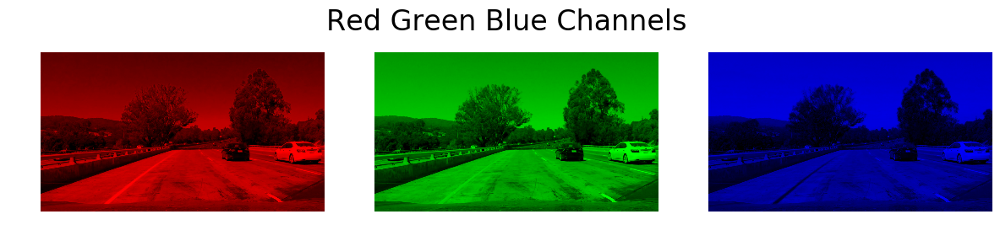

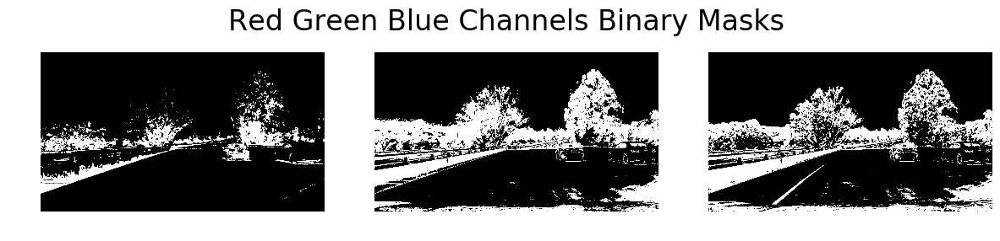

100%|████████████████████████████████████████████| 9/9 [00:04<00:00,  2.27it/s]


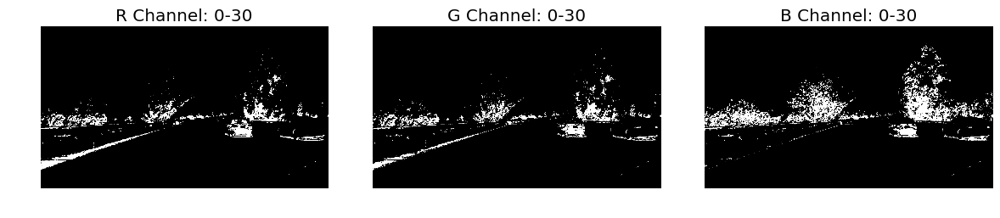

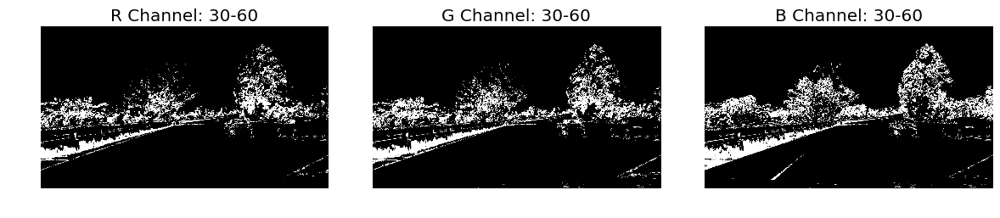

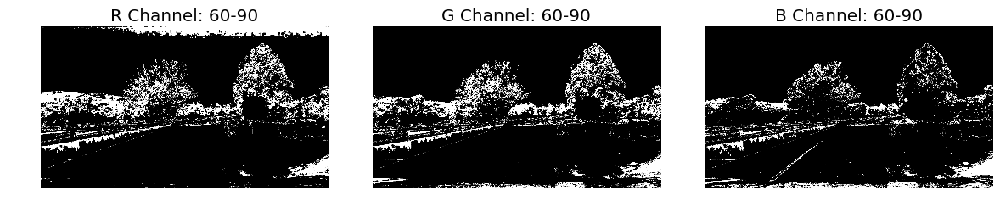

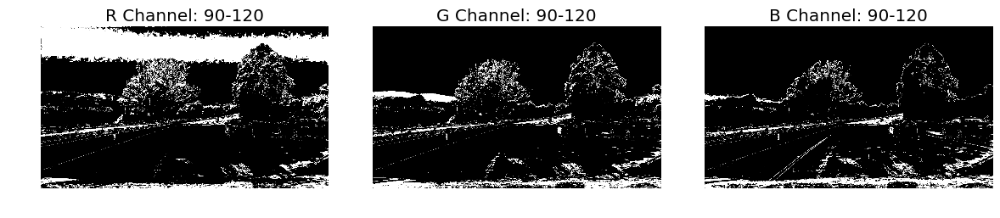

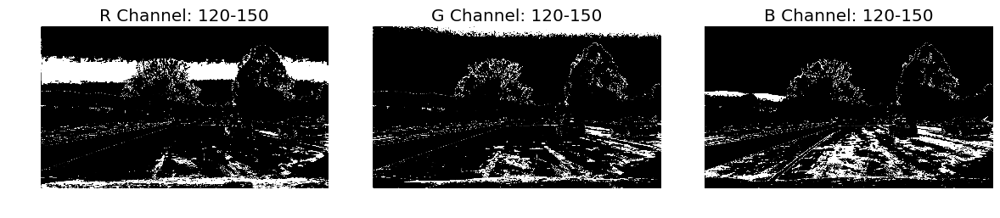

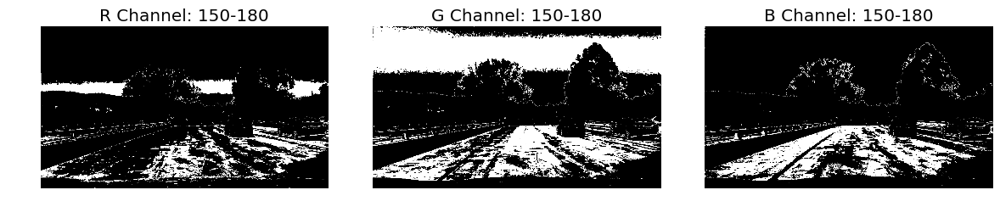

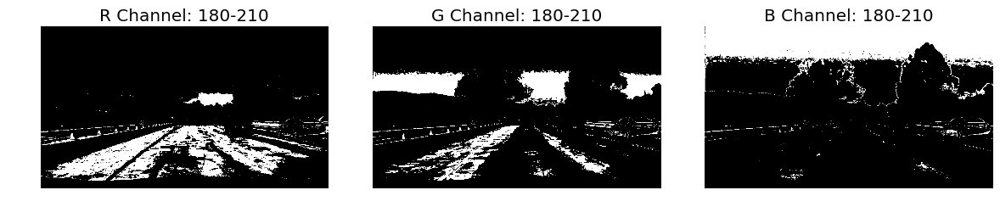

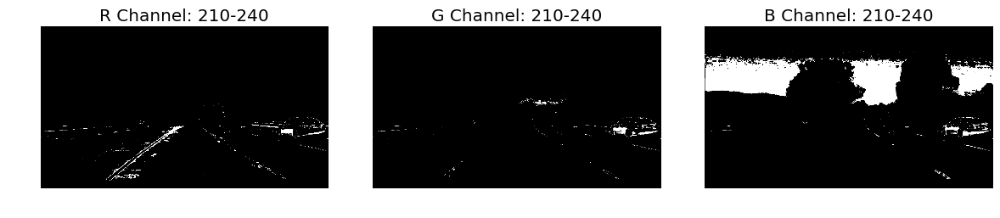

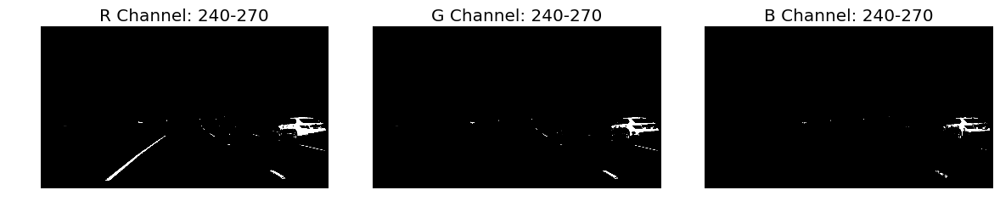

In [164]:
# Test out RGB color channels
R = np.dstack((image_RGB[:,:,0], np.zeros_like(image_RGB[:,:,0]), np.zeros_like(image_RGB[:,:,0])))
G = np.dstack((np.zeros_like(image_RGB[:,:,0]), image_RGB[:,:,1], np.zeros_like(image_RGB[:,:,0])))
B = np.dstack((np.zeros_like(image_RGB[:,:,0]), np.zeros_like(image_RGB[:,:,0]), image_RGB[:,:,2]))

fig, _ = plt.subplots(1,3, figsize=(12,12))
fig.suptitle('Red Green Blue Channels', y=0.63, fontsize=24)
fig.tight_layout()
# Plot Red
plt.subplot(1,3,1)
plt.axis('off')
plt.imshow(R)
# Plot Green
plt.subplot(1,3,2)
plt.axis('off')
plt.imshow(G)
# Plot Blue
plt.subplot(1,3,3)
plt.axis('off')
plt.imshow(B)
plt.show();

R = R[:,:,0]
G = G[:,:,1]
B = B[:,:,2]
r_binary = np.zeros_like(R)
r_binary[(R > 0) & (R < 50)] = 1
g_binary = np.zeros_like(G)
g_binary[(G > 30) & (G < 100)] = 1
b_binary = np.zeros_like(B)
b_binary[(B > 30) & (B < 100)] = 1

fig, _ = plt.subplots(1,3, figsize=(12,12))
fig.suptitle('Red Green Blue Channels Binary Masks', y=0.63, fontsize=24)
fig.tight_layout()
# Plot Red
plt.subplot(1,3,1)
plt.axis('off')
plt.imshow(r_binary, cmap='gray')
# Plot Green
plt.subplot(1,3,2)
plt.axis('off')
plt.imshow(g_binary, cmap='gray')
# Plot Blue
plt.subplot(1,3,3)
plt.axis('off')
plt.imshow(b_binary, cmap='gray')
plt.show();

for iter in tqdm(range(0,255,30)):
    step = 30

    r_binary = np.zeros_like(R)
    r_binary[(R > iter) & (R < iter+step)] = 1
    g_binary = np.zeros_like(G)
    g_binary[(G > iter) & (G < iter+step)] = 1
    b_binary = np.zeros_like(B)
    b_binary[(B > iter) & (B < iter+step)] = 1
    
    plt.subplots(1,3, figsize=(12,12))
    # Plot Red
    plt.subplot(1,3,1)
    plt.axis('off')
    plt.tight_layout()
    plt.title('R Channel: {}-{}'.format(iter, iter+step))
    plt.imshow(r_binary, cmap='gray')
    # Plot Green
    plt.subplot(1,3,2)
    plt.axis('off')
    plt.tight_layout()
    plt.title('G Channel: {}-{}'.format(iter, iter+step))
    plt.imshow(g_binary, cmap='gray')
    # Plot Blue
    plt.subplot(1,3,3)
    plt.axis('off')
    plt.tight_layout()
    plt.title('B Channel: {}-{}'.format(iter, iter+step))
    plt.imshow(b_binary, cmap='gray')

plt.show();

### Image Pipeline

In [175]:
def image_pipe(img, mtx=mtx, dist=dist):
    
    # Undistort BGR image
    undistort = undistort_img(img, mtx, dist)
    # Return only H channel from HLS conversion
    l_binary = return_l_channel(undistort, thresh=(200,255))
    # Return only H channel from HLS conversion
    s_binary = return_s_channel(undistort, thresh=(220,255))
    # Return gradient in the vertical direction
    sobel_x = apply_sobel_thresh(s_binary, ksize=15, thresh=(30,100))
    # Return gradient in the horizontal direction
    sobel_y = apply_sobel_thresh(s_binary, orient='y', ksize=15, thresh=(50,100))
    # Return only gradients in a particular direction
    sobel_dir = apply_dir_thresh(s_binary, ksize=13, thresh=(0.7, 1.3))
    # Return only gradients that meet a certain threshold
    sobel_mag = apply_mag_thresh(s_binary, ksize=5, thresh=(30,100))
    # Grab  Red, Green, Blue color channels
    image_rgb = cv2.cvtColor(undistort, cv2.COLOR_BGR2RGB)
    R = image_rgb[:,:,0]
    G = image_rgb[:,:,1]
    B = image_rgb[:,:,2]
    R_binary, G_binary, B_binary = np.zeros_like(R), np.zeros_like(G), np.zeros_like(B)
    R_binary[(R > 245) & (R < 255)] = 1
    G_binary[(G > 200) & (G < 255)] = 1
    B_binary[(B > 200) & (B < 255)] = 1
    # Combine Thresholded values
    combined_binary = np.zeros_like(s_binary)
    combined_binary[((sobel_x==1) & (sobel_y==1))
                   | (l_binary==1)
                   | (s_binary==1)
                   | (G_binary==1)
                   | (R_binary==1) 
                   | (B_binary==1)] = 1
    return combined_binary

#### Test Image Pipeline on multiple test images

100%|██████████████████████████████████████████| 10/10 [00:04<00:00,  2.14it/s]


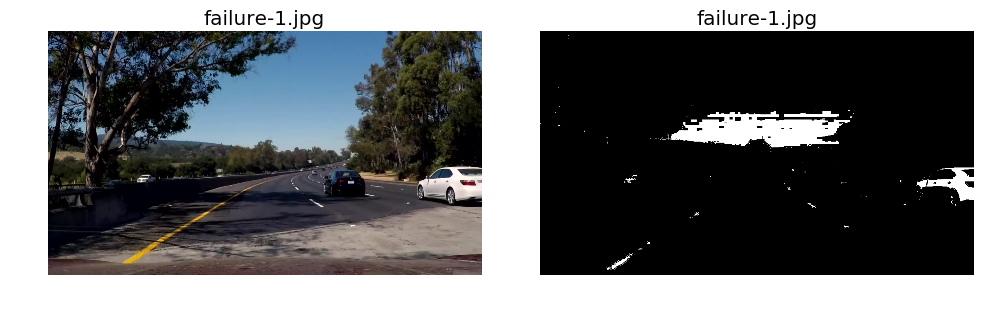

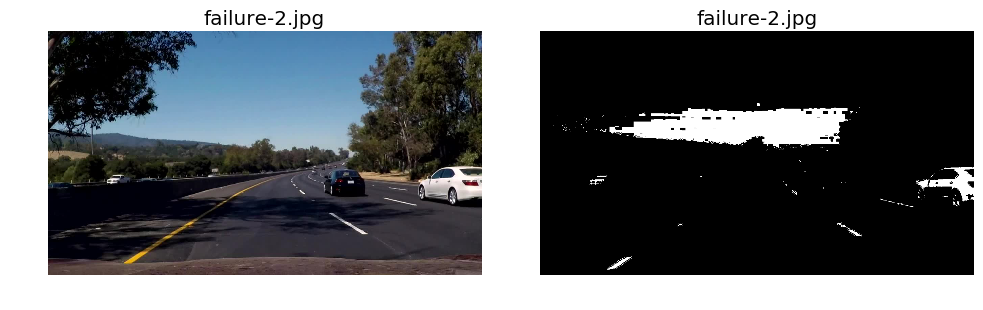

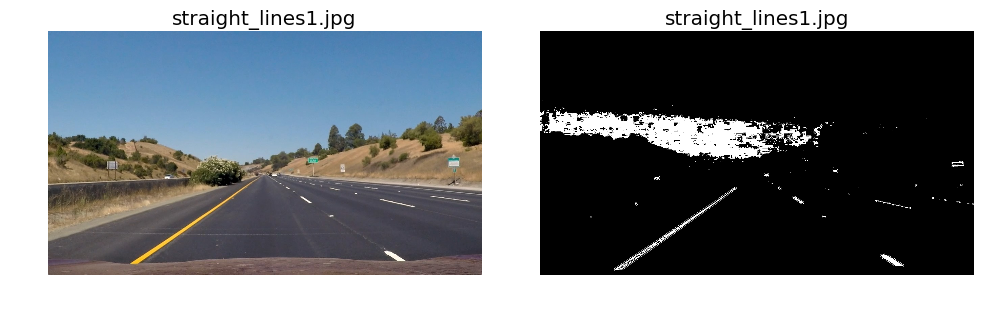

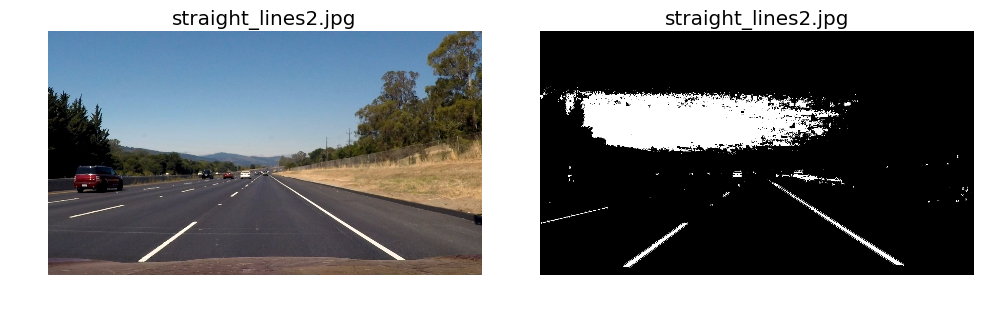

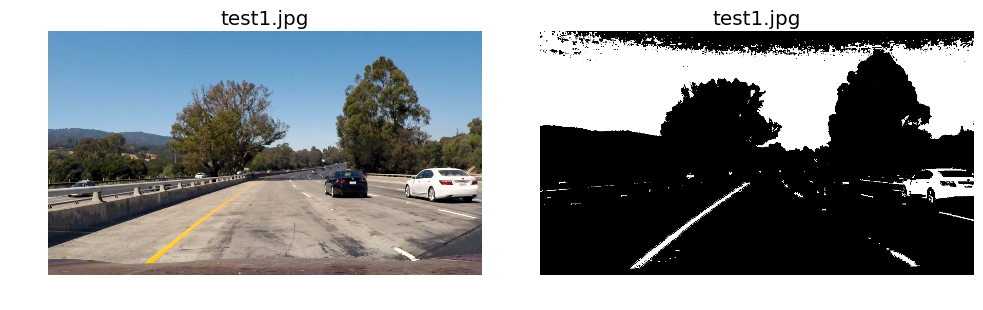

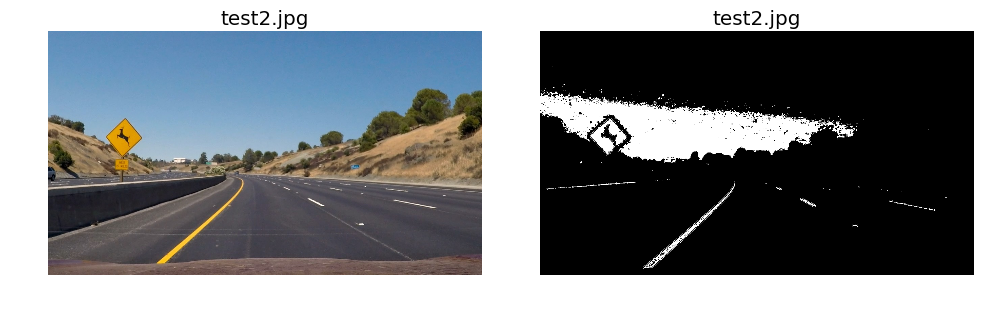

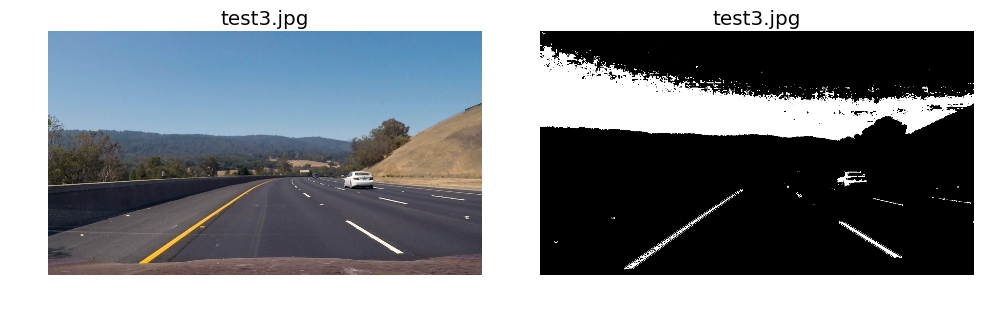

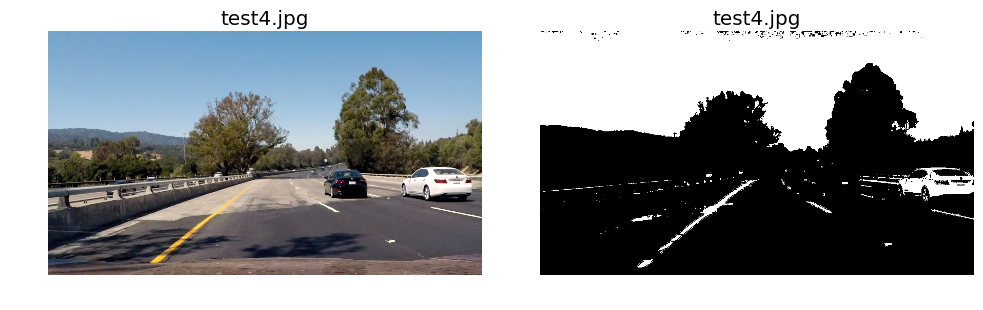

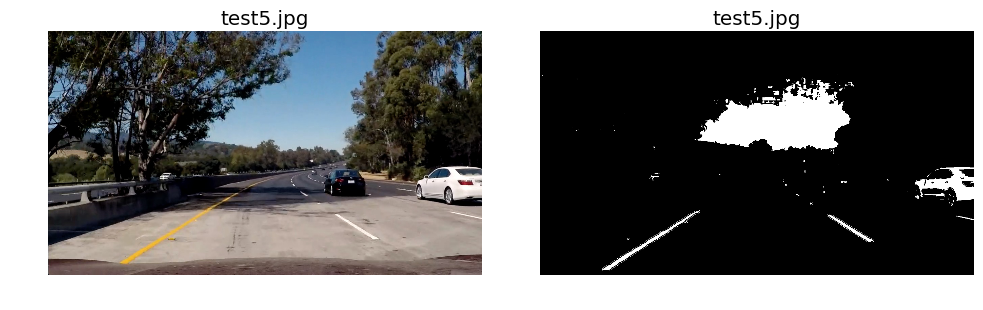

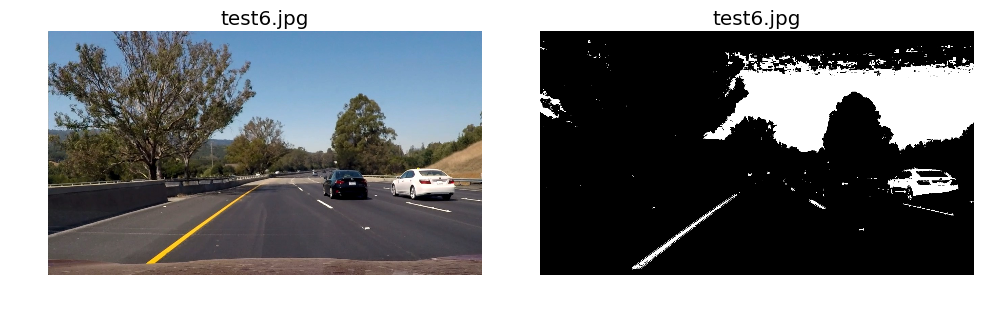

In [176]:
# Store images in test-images folder
images = glob.glob('test-images/*.jpg')

for image in tqdm(images):
    
    # Setup of a series of subplots
    plt.subplots(1,2, figsize=(10,10))
    plt.tight_layout()
    plt.axis('off')
    
    # Read image
    img = cv2.imread(image)

    # Plot orginal test image
    plt.subplot(1,2,1)
    plt.axis('off')
    plt.title(image.split('\\')[-1])
    image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(image_rgb)

    # Plot image that went through the image_pipeline
    plt.subplot(1,2,2)
    plt.axis('off')
    plt.title(image.split('\\')[-1])
    plt.imshow(image_pipe(img, mtx, dist), cmap='gray')
    
plt.show();

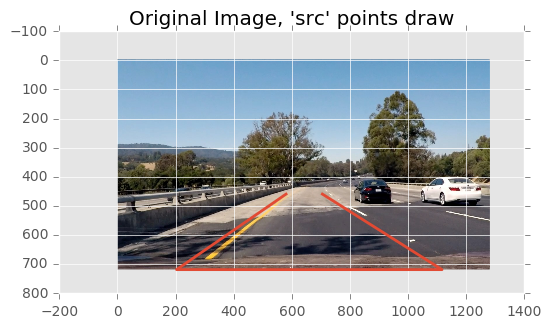

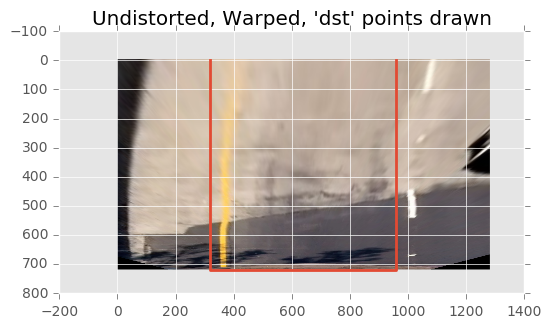

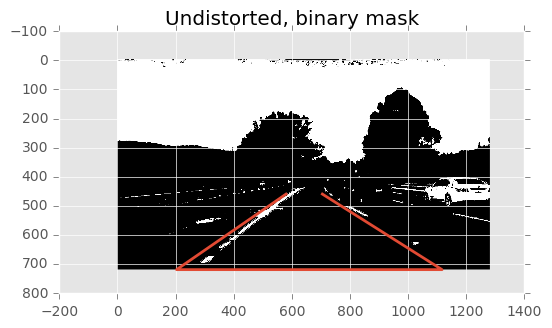

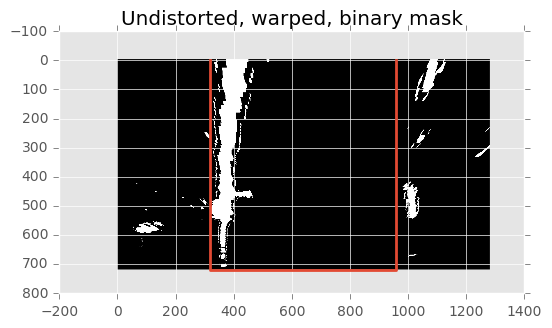

In [179]:
# Read in image, size
image = cv2.imread('test-images/test4.jpg')
image_RGB = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
undistort = undistort_img(image_RGB, mtx, dist)
img_size = (undistort.shape[1], undistort.shape[0])

# Hardcode src and dst points for warping
src = np.float32(
    [[(img_size[0] / 2) - 60, img_size[1] / 2 + 100],
    [((img_size[0] / 6) - 10), img_size[1]],
    [(img_size[0] * 5 / 6) + 50, img_size[1]],
    [(img_size[0] / 2 + 65), img_size[1] / 2 + 100]])
dst = np.float32(
    [[(img_size[0] / 4), 0],
    [(img_size[0] / 4), img_size[1]],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])

# Plot orginal image
plt.imshow(image_RGB)
plt.plot(src[:,0], src[:,1], linewidth=2.0)
plt.title('Original Image, \'src\' points draw')
plt.show()

# Plot undistored, warped image
plt.imshow(apply_perpspective(undistort, src, dst))
plt.plot(dst[:,0], dst[:,1], linewidth=2.0)
plt.title('Undistorted, Warped, \'dst\' points drawn')
plt.show()

# Plot undistorted, binary mask
image_binary = image_pipe(image, mtx, dist) # image_RGB since image_pipe undistorts
plt.imshow(image_binary, cmap='gray')
plt.plot(src[:,0], src[:,1], linewidth=2.0)
plt.title('Undistorted, binary mask')
plt.show()

# Plot undistored, warped binary mask
warp_binary = apply_perpspective(image_binary, src, dst)
plt.imshow(warp_binary, cmap='gray')
plt.plot(dst[:,0], dst[:,1], linewidth=2.0)
plt.title('Undistorted, warped, binary mask')
plt.show();

100%|██████████████████████████████████████████| 10/10 [00:07<00:00,  1.31it/s]


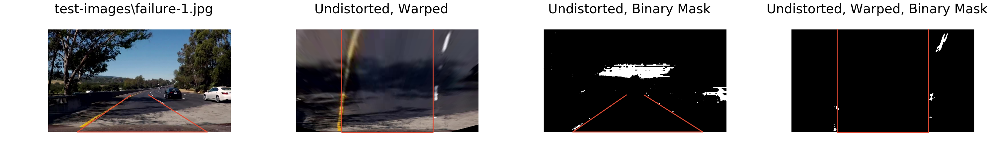

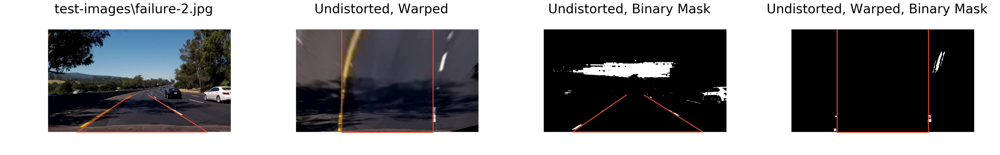

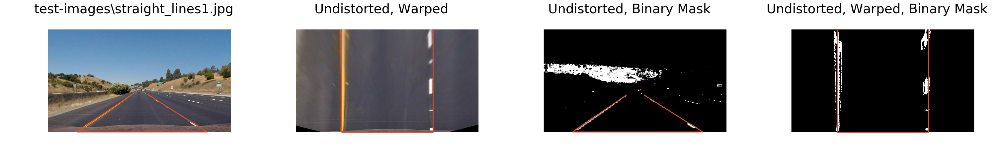

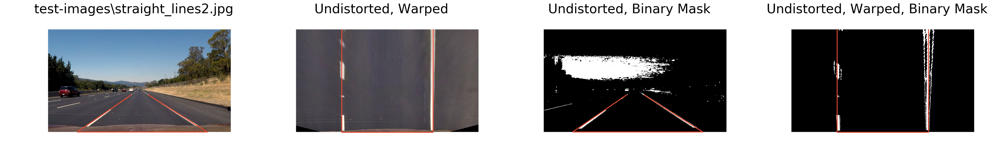

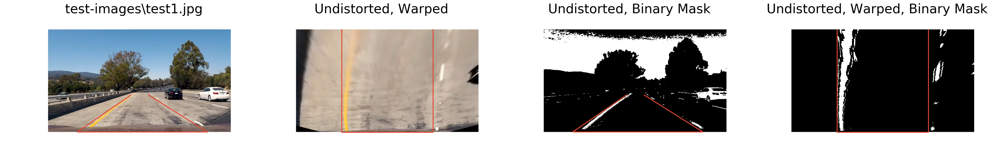

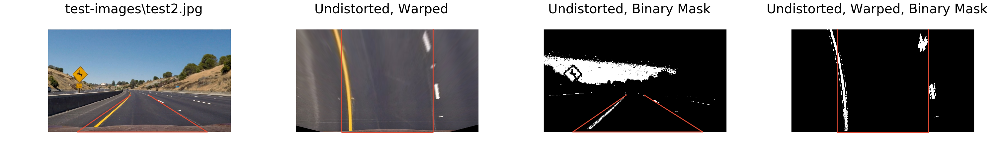

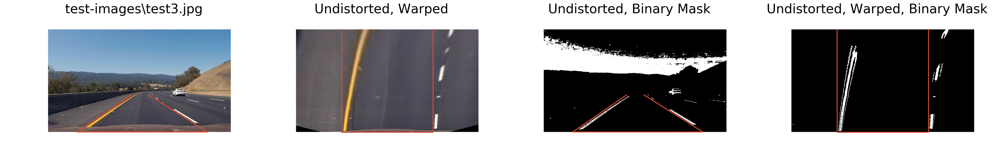

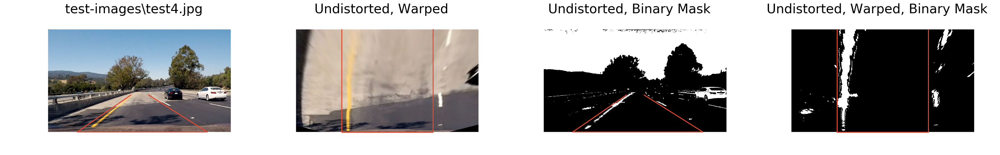

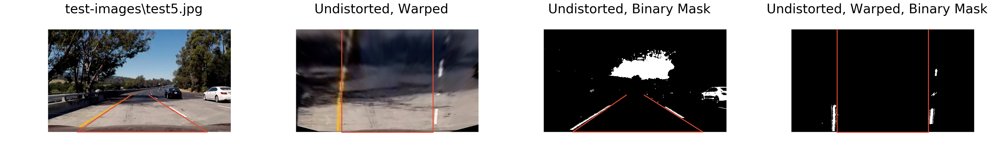

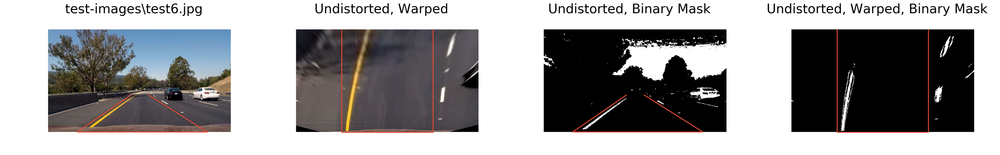

In [180]:
# Store images in test-images folder
images = glob.glob('test-images/*.jpg')

for image in tqdm(images):
    
    # Setup of a series of subplots
    plt.subplots(1,4, figsize=(30,20))
    plt.tight_layout()
    plt.axis('off')

    # Read in image, size
    title = image
    image = cv2.imread(image)
    image_RGB = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    undistort = undistort_img(image_RGB, mtx, dist)
    img_size = (undistort.shape[1], undistort.shape[0])
    
    # Plot orginal image
    plt.subplot(1,4,1)
    plt.axis('off')
    plt.imshow(image_RGB)
    plt.plot(src[:,0], src[:,1], linewidth=2.0)
    plt.title(title, fontdict={'fontsize':28})

    # Plot undistored, warped image
    plt.subplot(1,4,2)
    plt.axis('off')
    plt.imshow(apply_perpspective(undistort, src, dst))
    plt.plot(dst[:,0], dst[:,1], linewidth=2.0)
    plt.title('Undistorted, Warped', fontdict={'fontsize':28})

    # Plot undistorted, binary mask
    plt.subplot(1,4,3)
    plt.axis('off')
    image_binary = image_pipe(image, mtx, dist) # image_RGB since image_pipe undistorts
    plt.imshow(image_binary, cmap='gray')
    plt.plot(src[:,0], src[:,1], linewidth=2.0)
    plt.title('Undistorted, Binary Mask', fontdict={'fontsize':28})

    # Plot undistored, warped binary mask
    plt.subplot(1,4,4)
    plt.axis('off')
    warp_binary = apply_perpspective(image_binary, src, dst)
    plt.imshow(warp_binary, cmap='gray')
    plt.plot(dst[:,0], dst[:,1], linewidth=2.0)
    plt.title('Undistorted, Warped, Binary Mask', fontdict={'fontsize':28})
    
plt.show();

### Describe how (and identify where in your code) you identified lane-line pixels and fit their positions with a polynomial?
#### Methods have been used to identify lane line pixels in the rectified binary image. The left and right line have been identified and fit with a curved functional form (e.g., spine or polynomial). Example images with line pixels identified and a fit overplotted should be included in the writeup (or saved to a folder) and submitted with the project.

### Describe how (and identify where in your code) you calculated the radius of curvature of the lane and the position of the vehicle with respect to center.
#### Here the idea is to take the measurements of where the lane lines are and estimate how much the road is curving and where the vehicle is located with respect to the center of the lane. The radius of curvature may be given in meters assuming the curve of the road follows a circle. For the position of the vehicle, you may assume the camera is mounted at the center of the car and the deviation of the midpoint of the lane from the center of the image is the offset you're looking for. As with the polynomial fitting, convert from pixels to meters.

In [14]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        # average x values of the fitted line over the last n iterations
        self.bestx = None     
        # polynomial coefficients averaged over the last n iterations
        self.best_fit = []  
        # polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        # radius of curvature of the line in some units
        self.radius_of_curvature = None 
        # distance in meters of vehicle center from the line
        self.line_base_pos = []
        # average distance of vehicle's position over n iterations
        self.best_line_base_pos = None
        # difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        # x values for detected line pixels
        self.allx = None  
        # y values for detected line pixels
        self.ally = None
        
    def set_detected(self, detected):
        self.detected = detected
    
    def update_vehicles_center(self, dist):
        # put in the most recent reading
        # output an updated average
        # reminds me of a PID controller
        self.line_base_pos.append(dist)
        # keep only the most recent 'n' elements
        if len(self.line_base_pos) > 10: self.line_base_pos.pop(-11)
        self.best_line_base_pos = np.average(self.line_base_pos)
        return self.best_line_base_pos
    
    def update_poly_coefs(self, polyfit):
        # pass in an array. we'll just see how this does
        self.best_fit.append(polyfit)
        if len(self.best_fit) > 15: self.best_fit.pop(-16)
        self.current_fit = np.mean(self.best_fit, axis=0)
        return self.current_fit

In [15]:
# Create Left and Right Line classes
Left = Line()
Right = Line()

In [16]:
print(Left.update_vehicles_center(2))
print('Most recent 10 values')
print(Left.line_base_pos)
print('Best X pos\t{}'.format(Left.best_line_base_pos))
print('len of line_base_pos', len(Left.line_base_pos))

print(Left.update_poly_coefs([1,2,3]))
print(Left.update_poly_coefs([4,5,6]))

2.0
Most recent 10 values
[2]
Best X pos	2.0
len of line_base_pos 1
[ 1.  2.  3.]
[ 2.5  3.5  4.5]


In [126]:
# Create Left and Right Line classes
Left = Line()
Right = Line()

def draw_lane_and_stats(binary_warped):
    
    # Take this quick route if we already detected the lane
    if (Left.detected & Right.detected):
        # Assume you now have a new warped binary image 
        # from the next frame of video (also called "binary_warped")
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        margin = 100
        left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) \
                        & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
        right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) \
                         & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        # Fit a second order polynomial to each
        left_fit = Left.update_poly_coefs(np.polyfit(lefty, leftx, 2))
        right_fit = Right.update_poly_coefs(np.polyfit(righty, rightx, 2))
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        
        # I'll need to add a catch here in case it can't find where the lines are after so many frames
        pass
        Left.detected = True
        Right.detected = False
    
    # Start a brand new sliding window search
    else:
        # Take a histogram of the bottom half of the image
        histogram = np.sum(binary_warped[(int)(binary_warped.shape[0]/2):,:], axis=0)
        # Create an output image to draw on and  visualize the result
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]/2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        # Choose the number of sliding windows
        nwindows = 9
        # Set height of windows
        window_height = np.int(binary_warped.shape[0]/nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = binary_warped.nonzero() # Returns tuple: (y_pos, x_pos)
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base
        # Set the width of the windows +/- margin
        margin = 100
        # Set minimum number of pixels found to recenter window
        minpix = 50
        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window verticiess in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) 
                            & (nonzeroy < win_y_high) 
                            & (nonzerox >= win_xleft_low) 
                            & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) 
                             & (nonzeroy < win_y_high) 
                             & (nonzerox >= win_xright_low) 
                             & (nonzerox < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            # If you found > minpix pixels, recenter next window on their mean position/index
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)

        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds]
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds] 

        # Fit a second order polynomial to each
        left_fit = Left.update_poly_coefs(np.polyfit(lefty, leftx, 2))
        right_fit = Right.update_poly_coefs(np.polyfit(righty, rightx, 2))

        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        
        # Set the 'lanes-detected' flag
        Left.detected = True
        Right.detected = False
    
    # Color pixels of just left and right lane lines
    out_img = np.zeros_like(out_img)
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Prepare lane polygon vertices
    left_verts = [(x,y) for x,y in zip(left_fitx, ploty)]
    right_verts = [(x,y) for x,y in zip(right_fitx, ploty)]
    left = np.array(left_verts)
    right = np.array(right_verts)
    both = np.vstack((left, right[::-1]))

    # Draw lane polygon
    poly_lane = np.zeros_like(out_img)
    cv2.fillPoly(poly_lane, np.array([both], dtype=np.int32), (100,230,100))
    poly_and_lines_warped = cv2.addWeighted(out_img, 1, poly_lane, 1, 0)

    # Unwarp just the lane polygon and the lane-line colored pixels
    poly_and_lines = apply_unwarp(poly_and_lines_warped, dst, src)

    # Overlay lane stuff (from directly above) onto the original RGB image
#     lane_no_stats = cv2.addWeighted(unwarp_final, 0.3, img, 1, 0)

    """
    S T A T S
    """
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)

    # Calculate curvature of left and right lanes
    y_eval = np.max(ploty)
    left_curverad  = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    curv_diff = np.absolute(left_curverad-right_curverad) / np.min([left_curverad,right_curverad])*100
    # Assign color to curvature text
    if curv_diff < 10:
        curv_color = (100,210,100)
    elif curv_diff < 17:
        curv_color = (244, 173, 66)
    else:
        curv_color = (244, 116, 66)

    # Vehicle's offset from center. Neg. value means it's to the left of center
    avg_leftx_rightx = np.average([leftx_base, rightx_base])
    cen_offset = xm_per_pix*(avg_leftx_rightx - binary_warped.shape[1]/2)
    # Assign color to curvature text
    if cen_offset < 0.2:
        cen_color = (100,210,100)
    elif cen_offset < 0.4:
        cen_color = (244, 173, 66)
    else:
        cen_color = (244, 116, 66)

    # Create a nice backgound poly to write text on top
    poly_stats = np.zeros_like(poly_lane)
    width, height = warp_binary.shape[1], warp_binary.shape[0]
     # Start with Bottom-Left -> CW
    verts = np.array([[(0,height*0.17),(0,0),(width*0.48,0),(width*0.48,height*0.17)]], np.int32)
    cv2.fillPoly(poly_stats, verts, (20,20,20))
    final_img = cv2.addWeighted(poly_and_lines, 0.4, poly_stats, 0.6, 0.7)

    # Put the values of curvature and vehicle offset on the final image
    img_str_curv = 'Radius of Curvature: {:4.1f}m'.format(np.average([left_curverad, right_curverad]), align='>')
    img_str_offset = 'Vehicle\'s Center Offset: {:2.2f}m'.format(cen_offset, align='>')
    font = cv2.FONT_HERSHEY_COMPLEX
    cv2.putText(final_img, img_str_curv, (25,50), font, 1, curv_color, 3)
    cv2.putText(final_img, img_str_offset, (25,100), font, 1, cen_color,3)
    
    """
    Overlay Warped Picture
    """
#     poly_and_lines_warped_resized = cv2.resize(poly_and_lines_warped, (237,422))
#     final_img = cv2.addWeighted(poly_and_lines_warped_resized, 0.8, final_img, 0.2, 0,)
    return final_img

## Full Image Pipeline

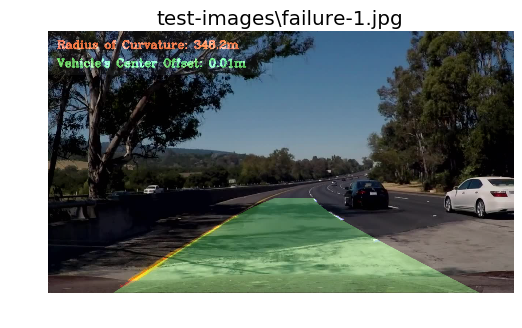

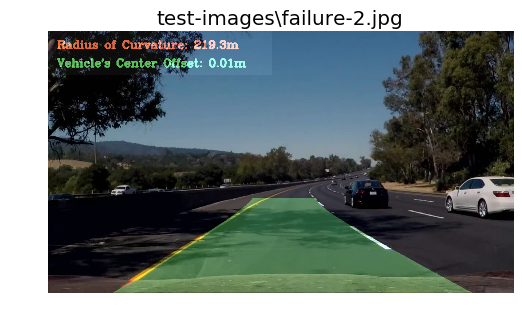

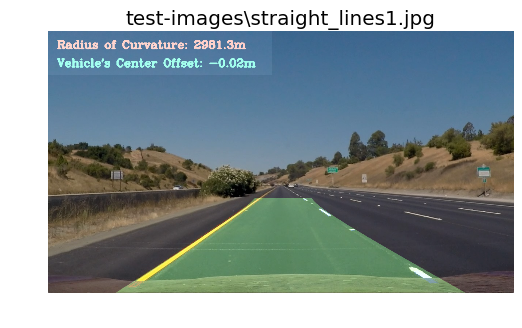

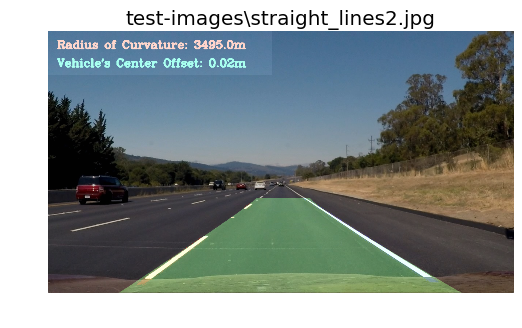

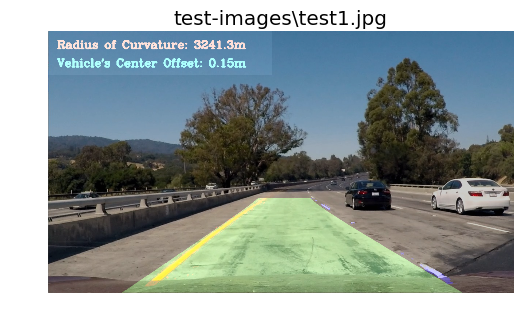

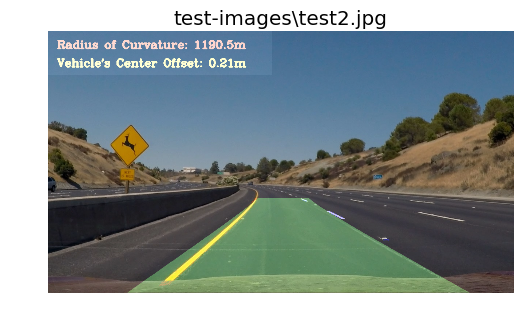

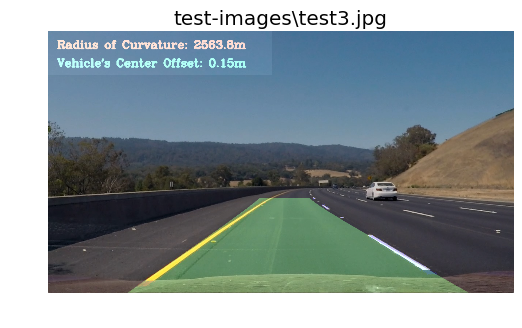

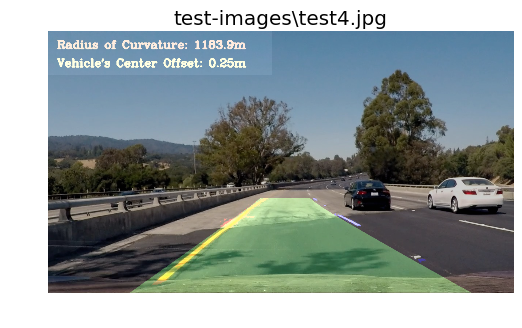

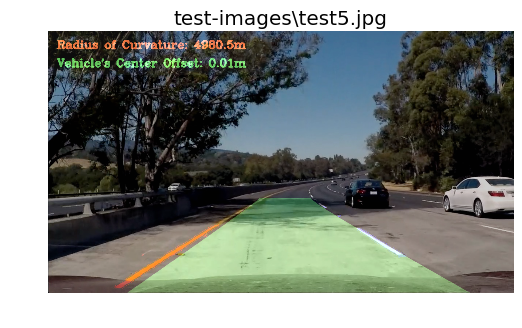

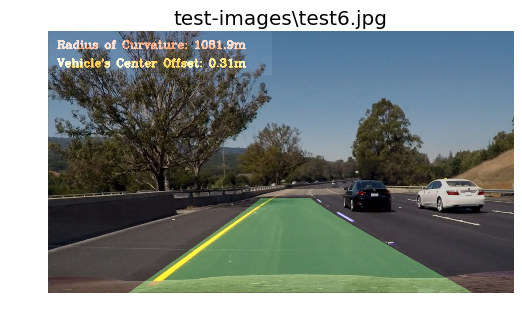

In [196]:
# Create Left and Right Line classes
Left = Line()
Right = Line()

def apply_lane_find(img):
    """
    
    """

    # Return an undistorted, combined-thresholded binary image
    combined_binary = image_pipe(img, mtx, dist)

    # Warp the returned combined-thresholded binary image
    binary_warped = apply_perpspective(combined_binary, src, dst)

    # Return an image with the lane poly, colored line-pixels, and stats drawn
    lane_draw = draw_lane_and_stats(binary_warped)
    
    # Overlay lane_draw onto final image
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    final_image = cv2.addWeighted(img, 0.8, lane_draw, 0.9, 0)
    
    return final_image

# Store images in test-images folder
images = glob.glob('test-images/*.jpg')

for image in images:
    img = cv2.imread(image)
    image_RGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.axis('off')
    plt.title(image)
    plt.imshow(apply_lane_find(img))
    plt.show()
pass;

## Short Test Clip

In [197]:
project_output = 'project-video-output-short.mp4'
clip1 = VideoFileClip('project-1-videos/challenge.mp4')
proj_clip = clip1.fl_image(apply_lane_find)
%time proj_clip.write_videofile(project_output, audio=False)

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))

OSError: [WinError 6] The handle is invalid

In [41]:
project_output = 'output-videos/video_full.mp4'
clip1 = VideoFileClip('project-video.mp4')
proj_clip = clip1.fl_image(apply_lane_find)
%time proj_clip.write_videofile(project_output, audio=False)

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))

[MoviePy] >>>> Building video output-videos/video_full.mp4
[MoviePy] Writing video output-videos/video_full.mp4


100%|█████████████████████████████████████▉| 1260/1261 [06:09<00:00,  3.38it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output-videos/video_full.mp4 

Wall time: 6min 10s


### Provide an example image of your result plotted back down onto the road such that the lane area is identified clearly.
#### The fit from the rectified image has been warped back onto the original image and plotted to identify the lane boundaries. This should demonstrate that the lane boundaries were correctly identified. An example image with lanes, curvature, and position from center should be included in the writeup (or saved to a folder) and submitted with the project.

### Provide a link to your final video output. Your pipeline should perform reasonably well on the entire project video (wobbly lines are ok but no catastrophic failures that would cause the car to drive off the road!)
#### The image processing pipeline that was established to find the lane lines in images successfully processes the video. The output here should be a new video where the lanes are identified in every frame, and outputs are generated regarding the radius of curvature of the lane and vehicle position within the lane. The pipeline should correctly map out curved lines and not fail when shadows or pavement color changes are present. The output video should be linked to in the writeup and/or saved and submitted with the project.